In [ ]:
# import tensorflow as tf

# filename_queue = tf.train.string_input_producer(
#             tf.train.match_filenames_once("../../../a/data/deep3d_data/frames/train/left/*.jpeg"))

# image_reader = tf.WholeFileReader()

# # Read a whole file from the queue, the first returned value in the tuple is the
# # filename which we are ignoring.
# _, image_file = image_reader.read(filename_queue)

# # Decode the image as a JPEG file, this will turn it into a Tensor which we can
# # then use in training.
# image = tf.image.decode_jpeg(image_file)
# image = tf.Print(image, data=[filename_queue.size(), image], message="Nb elements left, input:")

# with tf.Session() as sess:
#     # Required to get the filename matching to run.
#     tf.global_variables_initializer().run()

#     # Coordinate the loading of image files.
#     coord = tf.train.Coordinator()
#     threads = tf.train.start_queue_runners(coord=coord)

#     # Get an image tensor and print its value.
#     image_tensor = sess.run(image)
#     print(image_tensor)
    
#     # Finish off the filename queue coordinator.
#     coord.request_stop()
# coord.join(threads)

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import time

left_dir = "/a/data/deep3d_data/frames/train/left/"
right_dir = "/a/data/deep3d_data/frames/train/right/"


# base_names = map(str,range(4,3100)) - "3"
#base_tensor = tf.convert_to_tensor(base_names)

left_image_queue = tf.train.string_input_producer(
  left_dir + tf.convert_to_tensor(os.listdir(left_dir)),
  shuffle=False # Note: must set shuffle to False
)
right_image_queue = tf.train.string_input_producer(
  right_dir + tf.convert_to_tensor(os.listdir(right_dir)),
  shuffle=False # Note: must set shuffle to False
)

# use reader to read file
image_reader = tf.WholeFileReader()

_, left_image_raw = image_reader.read(left_image_queue)
left_image = tf.image.decode_jpeg(left_image_raw)

_, right_image_raw = image_reader.read(right_image_queue)
right_image = tf.image.decode_jpeg(right_image_raw)

left_image.set_shape([160,288,3])
right_image.set_shape([160,288,3])


# preprocess image
batch = tf.train.shuffle_batch([left_image, right_image], 
                               batch_size = 50,
                               capacity = 750,
                               num_threads = 1,
                               min_after_dequeue = 250,
                               allow_smaller_final_batch = True)


init_op = tf.global_variables_initializer()

# print batch
with tf.device('/cpu:0'):
    start = time.time()
    with tf.Session() as sess:
        sess.run(init_op)
        coord = tf.train.Coordinator()
        queue_threads = tf.train.start_queue_runners(coord=coord)
        
        for i in range(100):
            ret = sess.run(batch)
            print i, ret[0].shape
        
        coord.request_stop()
        coord.join(queue_threads)
    end = time.time()
    
print end-start

0 (50, 160, 288, 3)
1 (50, 160, 288, 3)
2 (50, 160, 288, 3)
3 (50, 160, 288, 3)
4 (50, 160, 288, 3)
5 (50, 160, 288, 3)
6 (50, 160, 288, 3)
7 (50, 160, 288, 3)
8 (50, 160, 288, 3)
9 (50, 160, 288, 3)
10 (50, 160, 288, 3)
11 (50, 160, 288, 3)
12 (50, 160, 288, 3)
13 (50, 160, 288, 3)
14 (50, 160, 288, 3)
15 (50, 160, 288, 3)
16 (50, 160, 288, 3)
17 (50, 160, 288, 3)
18 (50, 160, 288, 3)
19 (50, 160, 288, 3)
20 (50, 160, 288, 3)
21 (50, 160, 288, 3)
22 (50, 160, 288, 3)
23 (50, 160, 288, 3)
24 (50, 160, 288, 3)
25 (50, 160, 288, 3)
26 (50, 160, 288, 3)
27 (50, 160, 288, 3)
28 (50, 160, 288, 3)
29 (50, 160, 288, 3)
30 (50, 160, 288, 3)
31 (50, 160, 288, 3)
32 (50, 160, 288, 3)
33 (50, 160, 288, 3)
34 (50, 160, 288, 3)
35 (50, 160, 288, 3)
36 (50, 160, 288, 3)
37 (50, 160, 288, 3)
38 (50, 160, 288, 3)
39 (50, 160, 288, 3)
40 (50, 160, 288, 3)
41 (50, 160, 288, 3)
42 (50, 160, 288, 3)
43 (50, 160, 288, 3)
44 (50, 160, 288, 3)
45 (50, 160, 288, 3)
46 (50, 160, 288, 3)
47 (50, 160, 288, 3)
48

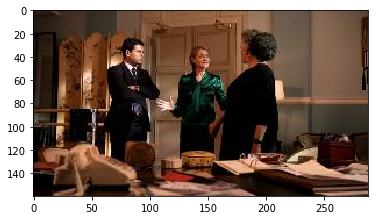

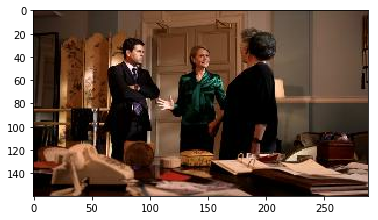

----------------


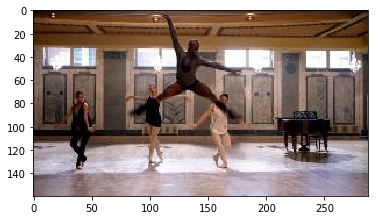

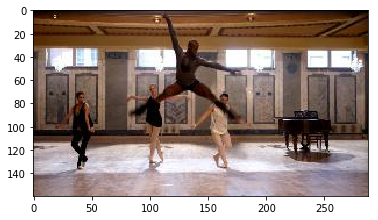

----------------


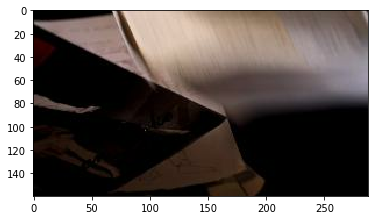

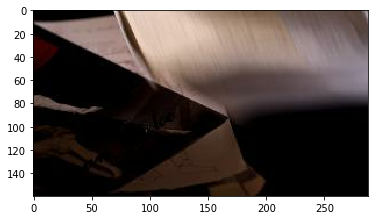

----------------


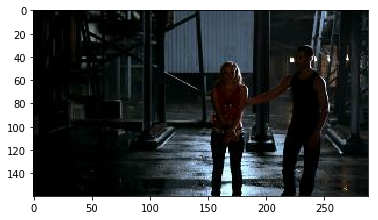

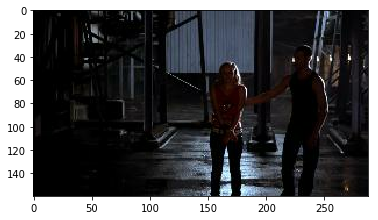

----------------


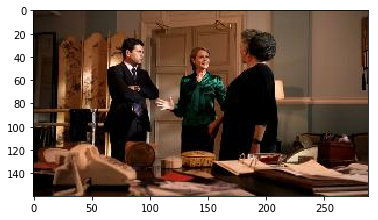

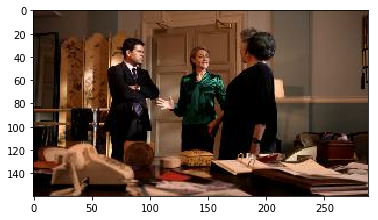

----------------


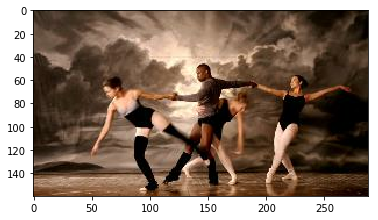

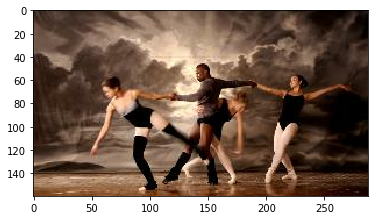

----------------


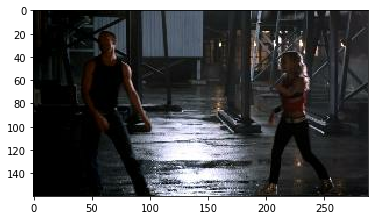

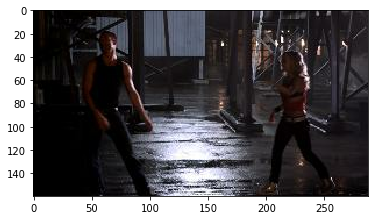

----------------


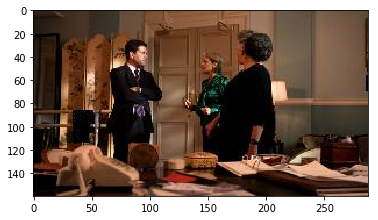

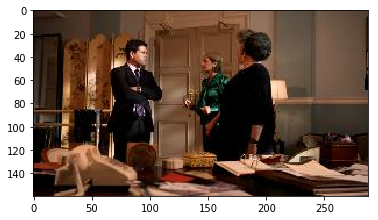

----------------


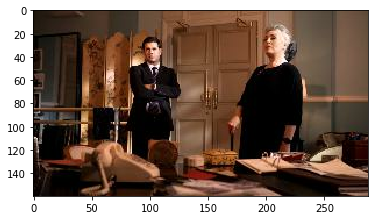

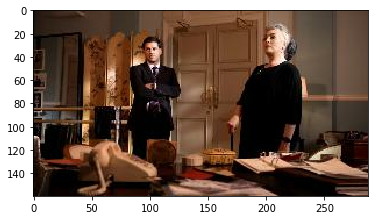

----------------


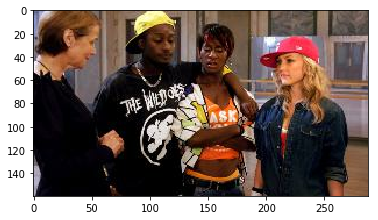

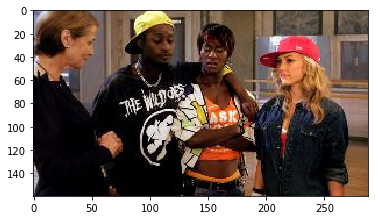

----------------


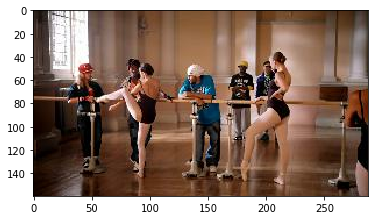

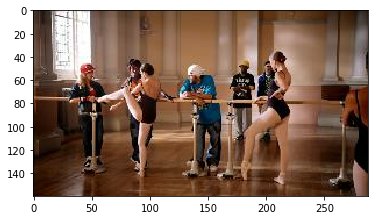

----------------


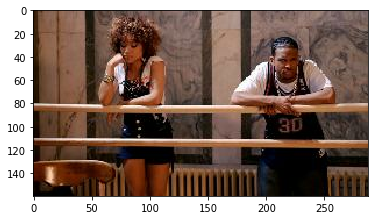

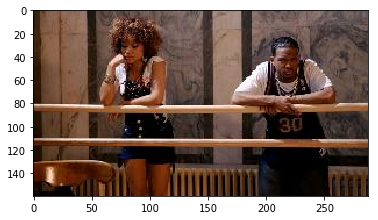

----------------


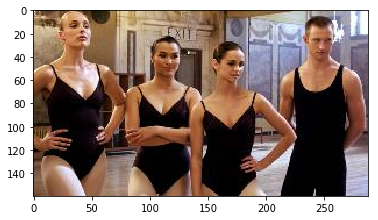

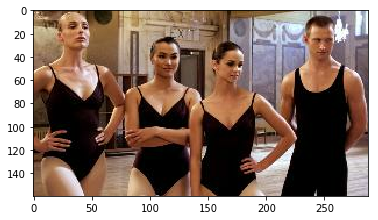

----------------


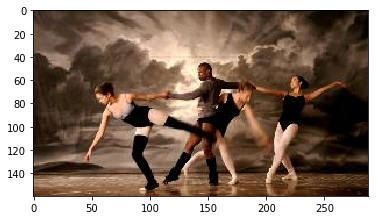

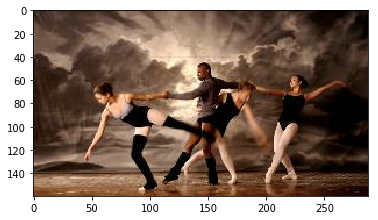

----------------


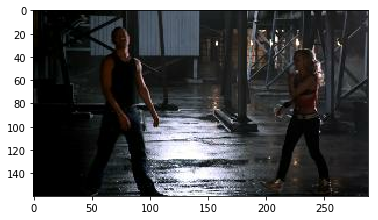

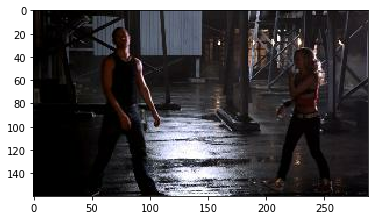

----------------


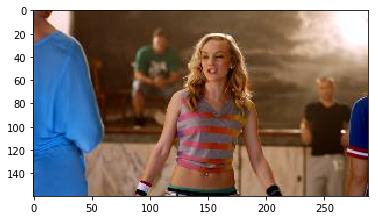

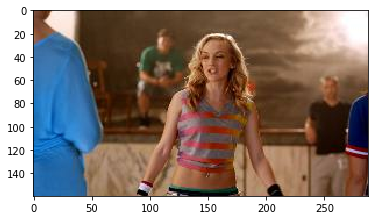

----------------


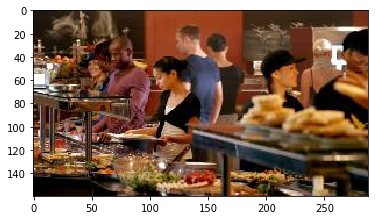

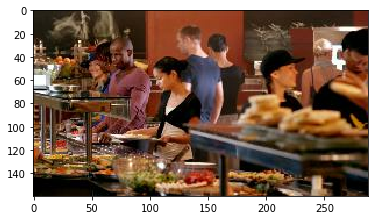

----------------


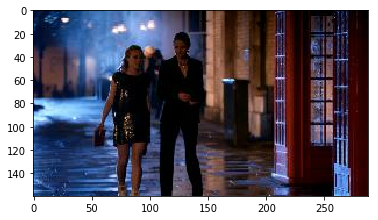

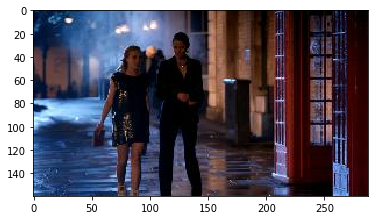

----------------


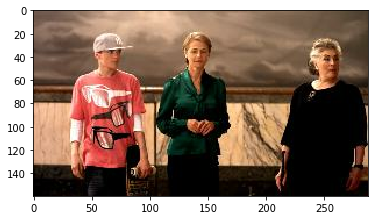

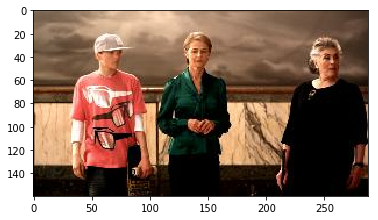

----------------


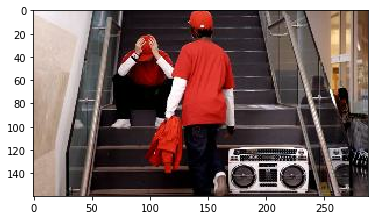

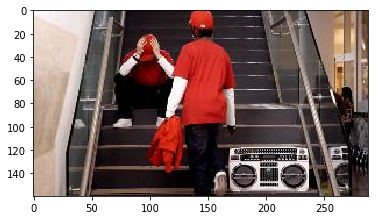

----------------


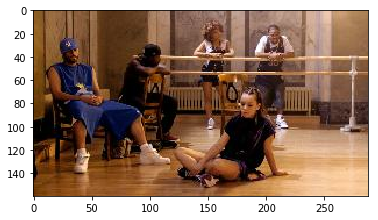

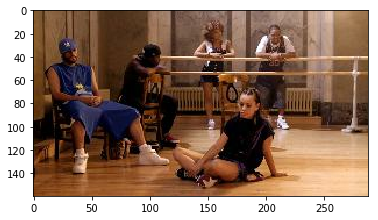

----------------


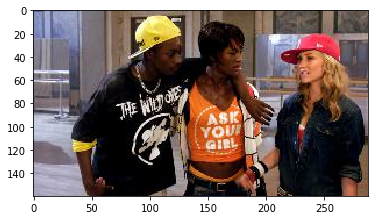

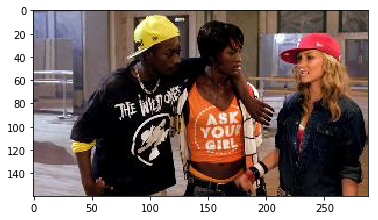

----------------


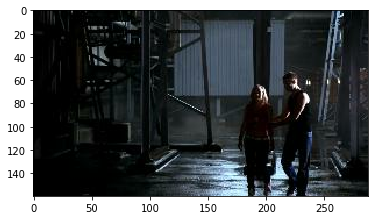

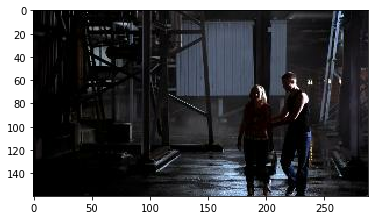

----------------


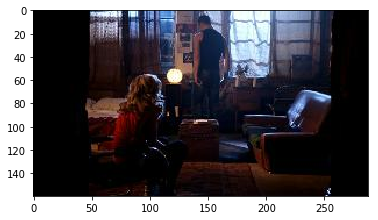

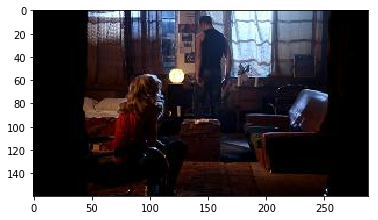

----------------


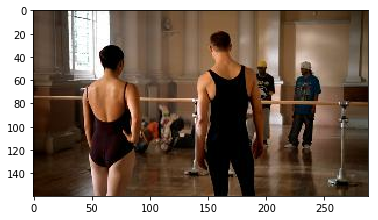

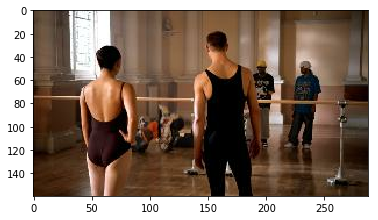

----------------


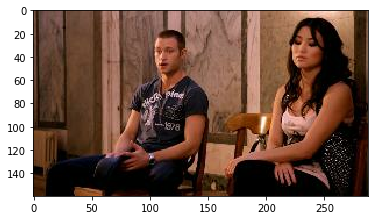

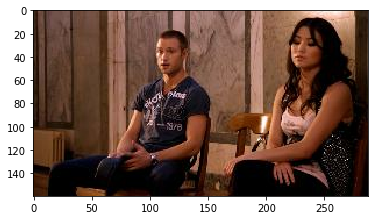

----------------


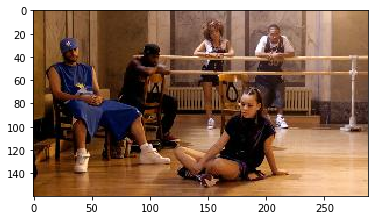

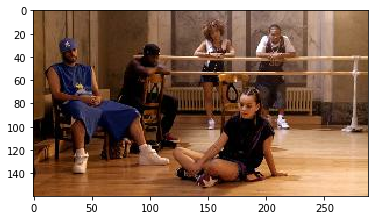

----------------


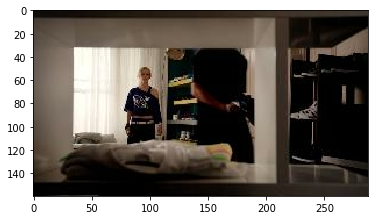

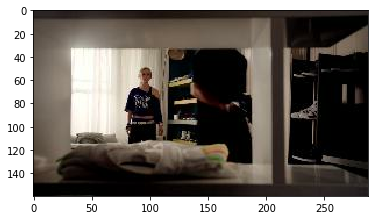

----------------


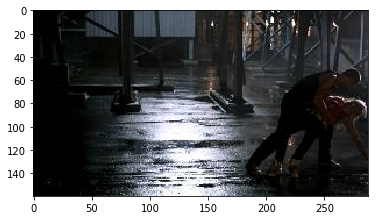

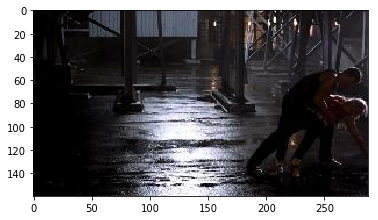

----------------


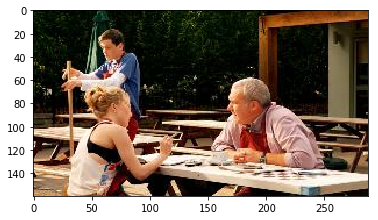

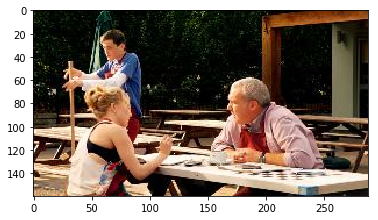

----------------


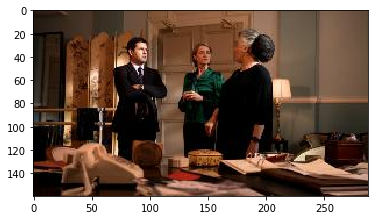

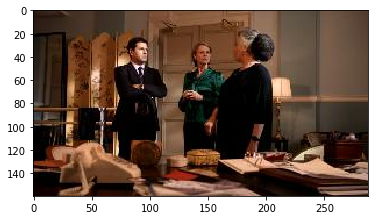

----------------


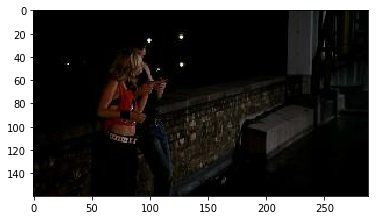

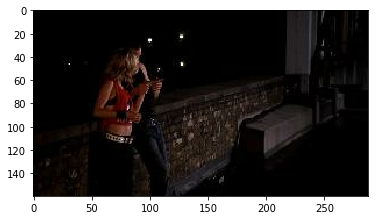

----------------


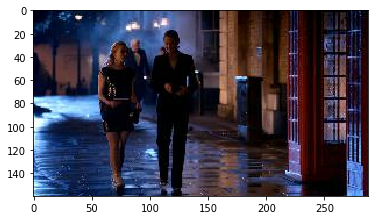

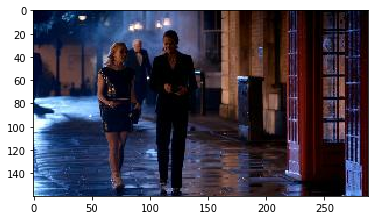

----------------


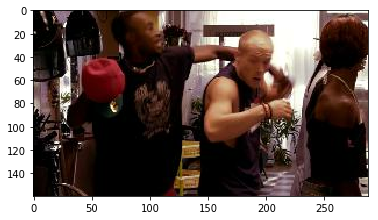

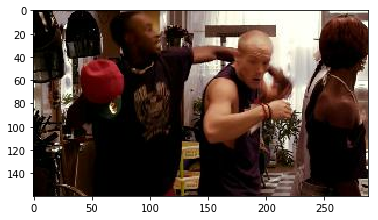

----------------


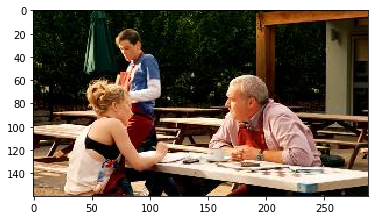

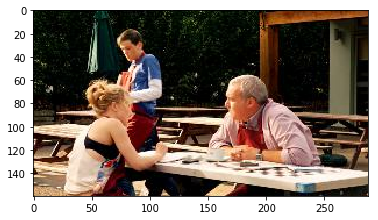

----------------


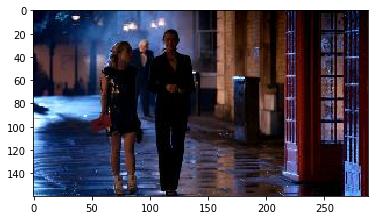

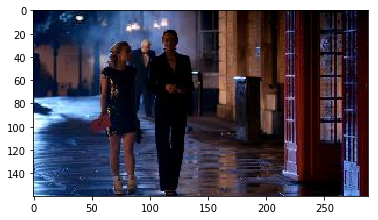

----------------


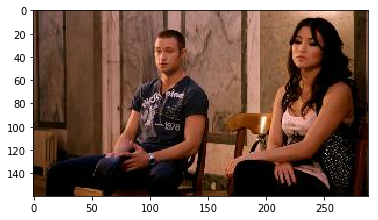

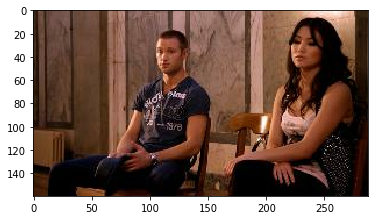

----------------


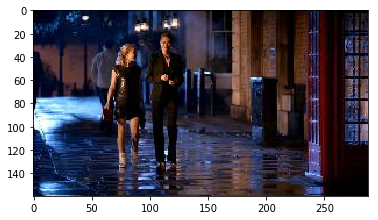

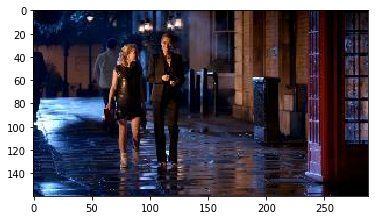

----------------


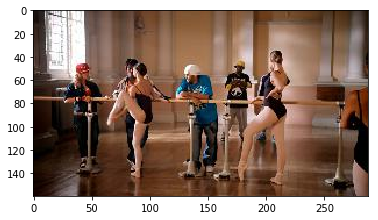

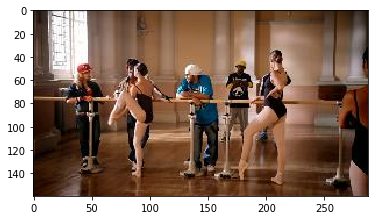

----------------


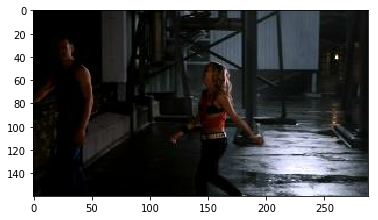

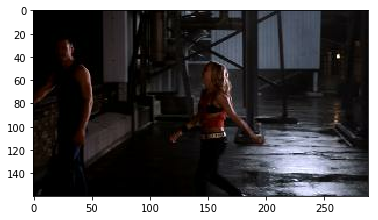

----------------


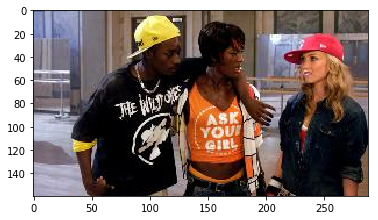

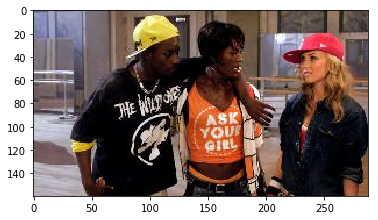

----------------


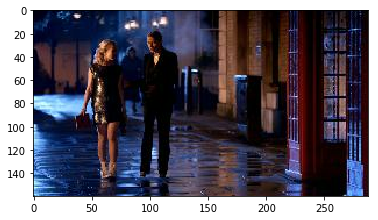

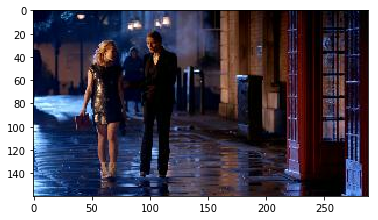

----------------


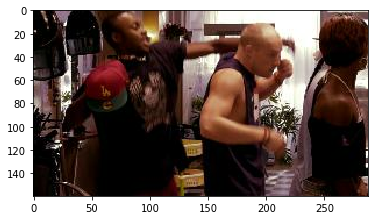

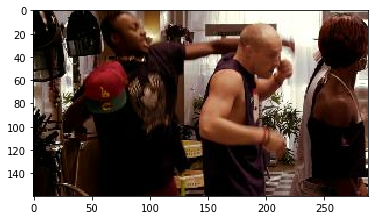

----------------


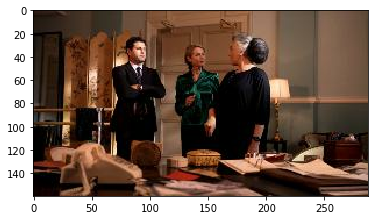

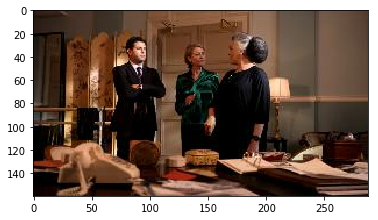

----------------


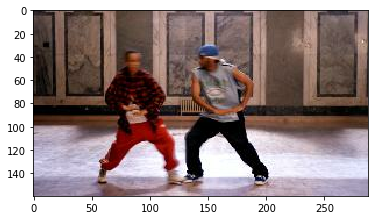

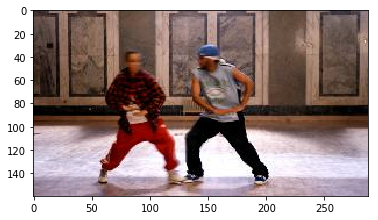

----------------


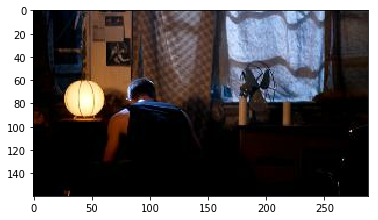

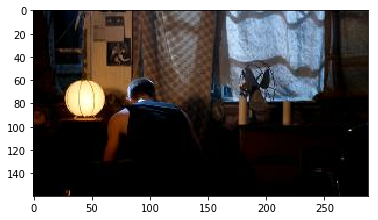

----------------


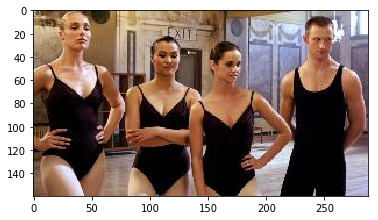

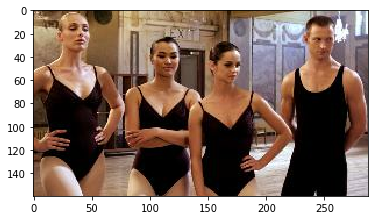

----------------


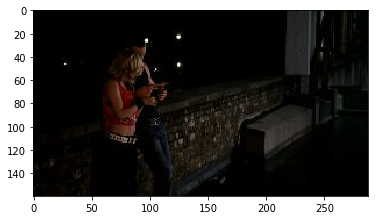

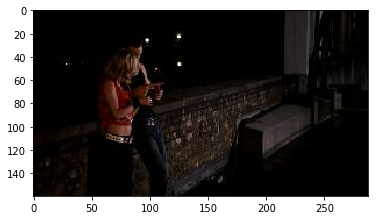

----------------


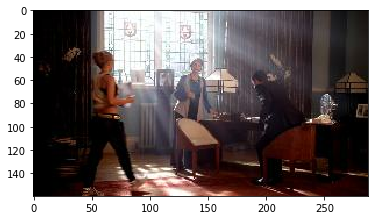

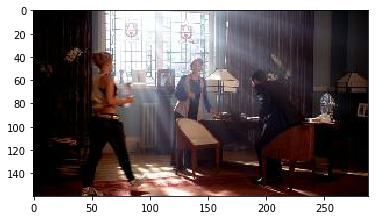

----------------


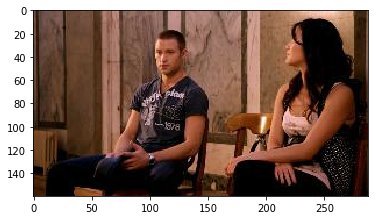

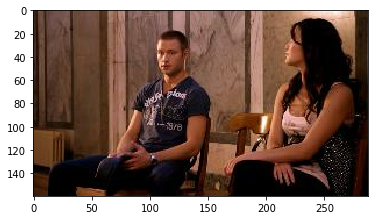

----------------


In [2]:
ret[0].shape
for i in range(ret[0].shape[0]):
    plt.imshow(ret[0][i])
    plt.show()
    plt.imshow(ret[1][i])
    plt.show()
    print("----------------")
